# MMDetection 모델 학습 실습


## 모델 설치 및 기본 세팅
---

### 라이브러리 설치
1. `mmcv` 설치
    - MMDetection을 설치하기 전, mmcv 설치가 선행되어야 한다.
    - `openmim`을 설치하여 `mim install`을 사용할 수 있도록 한다.
    - `mim install`을 통해 `mmengine`과 `mmcv` 패키지를 설치한다.
2. pytorch와 cuda 호환성 체크
    - `torch.cuda.is_available()`을 통해서 pytorch와 cuda가 서로 호환이 되는지 체크한다.
    - `torch.cuda.current_device()`으로 torch에서 사용하는 cuda device를 알 수 있다.
    - `torch.cuda.get_device_name(0)`으로 0번째 device의 이름을 알 수 있다.
3. mmdetection 파일 설치
    - 기존 MMDetection 파일을 다운로드한 적이 있다면 깔끔하게 정리하는 차원에서 `!rmdir /s /q` 명령어를 통해 기존 파일 삭제 (Linux 기준, `!rm -rf`)
    - `!git clone`을 통해 mmdetection 파일을 가져온다.
    - `!cd mmdetection & pip install -e .` 명령어를 통해서 필요한 패키지를 모두 설치한다. (Linux 기준, `!cd mmdetection; pip install -e .`)
    - `!cd ,`로 현재 위치 확인 (/content) (Linux 기준, `!pwd`)
    - 생성된 mmdetection 디렉토리로 이동한 후에 setup.py를 통해서 install 진행하기 위해서 `!cd mmdetection & python setup.py install` 실행 (Linux 기준, `!cd mmdetection; python setup.py install`)

※ `!`, `%` 차이
- `!`는 일회성.
- `%`로 실행하면 이후 코드에도 해당 명령어가 적용된 상태로 다음 명령어를 수행.
- `!` 예. `!cd direct`하면 디렉토리가 변경되지 않은 상태로 다음 명령어를 수행.
- `%` 예. `%cd direct`하면 디렉토리가 변경된 상태로 다음 명령어를 수행.

In [1]:
# mmcv 설치
%pip install torch==1.12.1+cu113 torchvision==0.13.1+cu113 torchaudio==0.12.1 --extra-index-url https://download.pytorch.org/whl/cu113
%pip install -U openmim
!mim install "mmengine>=0.7.0"
!mim install "mmcv>=2.0.0rc4"

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html


Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html


In [2]:
# pytorch와 cuda 호환성 체크
import torch
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.get_device_name(0))

True
0
NVIDIA GeForce RTX 3050 Ti Laptop GPU


In [3]:
# mmdetection 파일 설치
!rmdir /s /q mmdetection
# !rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git

!cd mmdetection & pip install -e .
# !cd mmdetection; pip install -e .

Cloning into 'mmdetection'...
Updating files:  94% (2025/2136)
Updating files:  95% (2030/2136)
Updating files:  96% (2051/2136)
Updating files:  97% (2072/2136)
Updating files:  98% (2094/2136)
Updating files:  99% (2115/2136)
Updating files: 100% (2136/2136)
Updating files: 100% (2136/2136), done.


Obtaining file:///C:/Users/SSAFY/object-detection/practice/mmdetection
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py develop for mmdet


In [4]:
# mmdetection 파일 설치 - setup.py 실행
!cd ,
# !pwd
!cd mmdetection & python setup.py install
# !cd mmdetection; python setup.py install

C:\Users\SSAFY\object-detection\practice
running install
running bdist_egg
running egg_info
writing manifest file 'mmdet.egg-info\SOURCES.txt'
running install_lib
running build_py
creating build
creating build\lib
creating build\lib\mmdet
copying mmdet\registry.py -> build\lib\mmdet
copying mmdet\version.py -> build\lib\mmdet
copying mmdet\__init__.py -> build\lib\mmdet
creating build\lib\mmdet\apis
copying mmdet\apis\det_inferencer.py -> build\lib\mmdet\apis
copying mmdet\apis\inference.py -> build\lib\mmdet\apis
copying mmdet\apis\__init__.py -> build\lib\mmdet\apis
creating build\lib\mmdet\datasets
copying mmdet\datasets\ade20k.py -> build\lib\mmdet\datasets
copying mmdet\datasets\base_det_dataset.py -> build\lib\mmdet\datasets
copying mmdet\datasets\base_semseg_dataset.py -> build\lib\mmdet\datasets
copying mmdet\datasets\base_video_dataset.py -> build\lib\mmdet\datasets
copying mmdet\datasets\cityscapes.py -> build\lib\mmdet\datasets
copying mmdet\datasets\coco.py -> build\lib\mmd

C:\Users\SSAFY\miniconda3\lib\site-packages\setuptools\command\install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
C:\Users\SSAFY\miniconda3\lib\site-packages\setuptools\command\easy_install.py:156: EasyInstallDeprecationWarning: easy_install command is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
error: [WinError 5] 액세스가 거부되었습니다: 'c:\\users\\ssafy\\miniconda3\\lib\\site-packages\\mmdet-3.1.0-py3.10.egg\\mmdet\\datasets\\transforms\\__pycache__\\instaboost.cpython-310.pyc.1894800743024' -> 'c:\\users\\ssafy\\miniconda3\\lib\\site-packages\\mmdet-3.1.0-py3.10.egg\\mmdet\\datasets\\transforms\\__pycache__\\instaboost.cpython-310.pyc'


### pretrained 모델 / config 파일 세팅
1. pretrained 모델 링크 주소 확인
    - [github](https://github.com/open-mmlab/mmdetection) 페이지에서 `configs` 폴더에 다양한 인공지능 알고리즘이 존재한다.
    - 예제에서는 `faster-rcnn`을 기준으로 진행한다.
2. config 파일 확인
    - 선택한 model 좌측에 위치해 있는 `config` 파일을 선택한다.
3. model 파일 코랩에서 다운로드
    - 먼저 model 파일을 저장할 폴더(checkpoints)를 생성한다.
    - `!wget` 명령어를 통해 모델을 다운로드한다.
    - 다운로드 완료 후에는 `config` 파일과 다운로드한 `.pth` 파일 경로를 각 변수에 저장한다.
    - `-c`에 넣을 값이 앞서 복사한 링크 주소이고, `-O`는 어느 경로에 어떤 이름으로 파일을 저장할지 적어준 것이다.

In [5]:
# model 파일 코랩에서 다운로드 - 모델 파일 다운로드
!cd mmdetection & mkdir checkpoints & \
        wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
            -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
# !cd mmdetection & mkdir checkpoints & \
#         mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest ./checkpoints

# !cd mmdetection; mkdir checkpoints; \
#         wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
#             -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

--2023-09-13 17:40:55--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.22.210, 163.181.22.216, 163.181.22.215, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.22.210|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

     0K .......... .......... .......... .......... ..........  0% 5.19M 31s
    50K .......... .......... .......... .......... ..........  0% 3.43M 39s
   100K .......... .......... .......... .......... ..........  0% 4.45M 38s
   150K .......... .......... .......... .......... ..........  0% 4.30M 38s
   200K .......... .......... .......... .......... ..........  0% 8.73M 34s
   250K ....

In [7]:
# model 파일 코랩에서 다운로드 - 변수 저장
# config_file = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
model_name = 'faster-rcnn_r50-caffe_fpn_ms-3x_coco'
checkpoint_file = './checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

### 모델 inference 방법
1. 모델 초기화
    - device로 cpu를 사용하고 싶다면 `cpu`를 적어주면 되고, 만약 gpu를 사용하고 싶다면 `cuda:0`을 작성한다.
    - `DetInferencer()`을 통해서 설정값과 모델 결정한다.
2. 모델 데모 inference
    - MMDetection에서는 테스트 용으로 데모 이미지를 제공한다.(`mmdetection/demo/demo.jpg`)
    - 이미지 파일을 변수 형태로 담고, inferencer()를 실행시켜 이미지의 사물을 탐지한다.
    - `score_thr`는 threshold를 의미하며, 모델이 확신하는 정도가 0.3 이하는 바운딩 박스를 그리지 말라는 의미
    - pprint()을 통해서 시각적으로 보기 좋게 출력한다.
    - Image.open()으로 기존 사진에 인식한 사물을 그려내어 출력한 결과를 볼 수 있다.

In [8]:
# mmdetection 디렉토리로 이동
%cd mmdetection

[WinError 2] 지정된 파일을 찾을 수 없습니다: 'mmdetection'
C:\Users\SSAFY\object-detection\practice\mmdetection


In [ ]:
# 라이브러리 충돌 방지
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [20]:
# 모델 초기화
from mmdet.apis import DetInferencer

# Choose to use a config
# model_name = 'faster_rcnn_r50_caffe_fpn_mstrain_3x_coco'
# Setup a checkpoint file to load
# checkpoint = './checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device = 'cpu'

# Initialize the DetInferencer
inferencer = DetInferencer(model_name, checkpoint_file, device)

Loads checkpoint by local backend from path: ./checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


In [21]:
# 모델 데모 inference
# img = './demo/demo.jpg'
img = './demo/gunman.jpg'
result = inferencer(img, out_dir='./output')

Output()

In [22]:
# 모델 데모 inference - 결과 확인
from rich.pretty import pprint
pprint(result, max_length=4)

{
│   'predictions': [
│   │   {
│   │   │   'labels': [0, 65, 65, 67, ... +22],
│   │   │   'scores': [0.9991132616996765, 0.49224594235420227, 0.34001028537750244, 0.3360905349254608, ... +22],
│   │   │   'bboxes': [
│   │   │   │   [813.0989990234375, 108.36096954345703, 2043.41064453125, 2208.244140625],
│   │   │   │   [2.4428536891937256, 2090.24072265625, 227.6162109375, 2202.92724609375],
│   │   │   │   [293.68365478515625, 1880.1365966796875, 595.3682861328125, 1977.031494140625],
│   │   │   │   [646.6174926757812, 161.49412536621094, 1229.4998779296875, 1142.8067626953125],
│   │   │   │   ... +22
│   │   │   ]
│   │   }
│   ],
│   'visualization': [
│   │   array([[[180, 189, 198],
│   │   [180, 189, 198],
│   │   [181, 190, 199],
│   │   ...,
│   │   [188, 199, 203],
│   │   [188, 199, 205],
│   │   [187, 198, 204]],
│      
│      [[180, 189, 198],
│   │   [180, 189, 198],
│   │   [180, 189, 198],
│   │   ...,
│   │   [187, 198, 202],
│   │   [187, 198, 204],
│   │   [186, 197, 203]],
│      
│      [[180, 189, 198],
│   │   [180, 189, 198],
│   │   [179, 189, 198],
│   │   ...,
│   │   [186, 197, 201],
│   │   [186, 197, 203],
│   │   [185, 196, 202]],
│      
│      ...,
│      
│      [[ 66,  75,  74],
│   │   [ 61,  70,  69],
│   │   [ 57,  66,  65],
│   │   ...,
│   │   [152, 132, 108],
│   │   [143, 123,  99],
│   │   [121, 101,  77]],
│      
│      [[ 63,  72,  71],
│   │   [ 60,  69,  68],
│   │   [ 57,  66,  65],
│   │   ...,
│   │   [132, 112,  88],
│   │   [135, 115,  91],
│   │   [124, 104,  80]],
│      
│      [[ 58,  67,  66],
│   │   [ 55,  64,  63],
│   │   [ 54,  63,  62],
│   │   ...,
│   │   [105,  85,  61],
│   │   [123, 103,  79],
│   │   [130, 110,  86]]], dtype=uint8)
│   ]
}

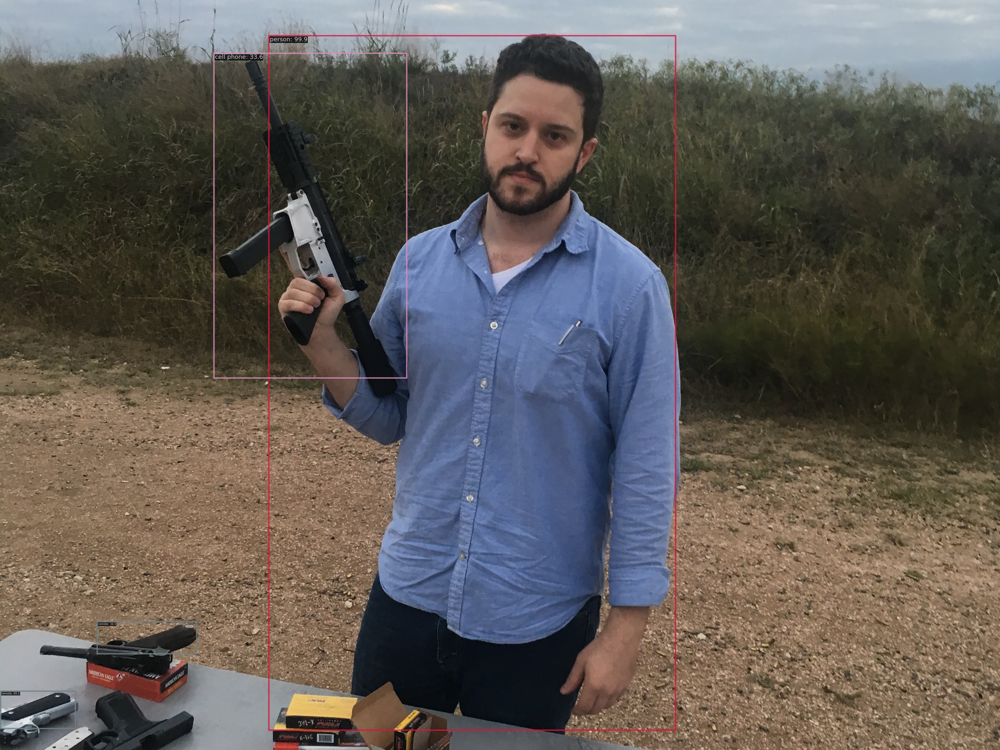

In [23]:
# 모델 데모 inference - 결과 확인 (이미지)
from PIL import Image
Image.open('./output/vis/gunman.jpg')

 ---

## 커스텀 데이터셋 학습
---

### 학습 데이터 준비
1. 학습 데이터 다운로드
    - download_dataset.py를 통해서 데이터셋을 다운로드하여 balloon 이라는 이름으로 data라는 폴더에 압축해제하여 저장한다.

In [12]:
# 학습 데이터 다운로드
!python tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

Unzipping balloon_dataset.zip



  0%|          | 0.00/36.9M [00:00<?, ?B/s]
  3%|3         | 1.20M/36.9M [00:00<00:03, 11.3MB/s]
  6%|6         | 2.28M/36.9M [00:00<00:03, 9.13MB/s]
  9%|8         | 3.23M/36.9M [00:00<00:03, 9.43MB/s]
 15%|#5        | 5.65M/36.9M [00:00<00:02, 14.5MB/s]
 19%|#9        | 7.05M/36.9M [00:00<00:04, 7.13MB/s]
 22%|##1       | 8.08M/36.9M [00:01<00:05, 5.70MB/s]
 24%|##4       | 8.88M/36.9M [00:01<00:06, 4.36MB/s]
 26%|##5       | 9.48M/36.9M [00:01<00:06, 4.51MB/s]
 27%|##7       | 10.1M/36.9M [00:01<00:06, 4.22MB/s]
 29%|##8       | 10.6M/36.9M [00:02<00:07, 3.48MB/s]
 30%|##9       | 11.0M/36.9M [00:02<00:08, 3.38MB/s]
 31%|###       | 11.4M/36.9M [00:02<00:07, 3.45MB/s]
 32%|###2      | 11.9M/36.9M [00:02<00:06, 3.80MB/s]
 33%|###3      | 12.3M/36.9M [00:02<00:07, 3.52MB/s]
 34%|###4      | 12.6M/36.9M [00:02<00:08, 3.06MB/s]
 35%|###5      | 13.0M/36.9M [00:02<00:08, 3.01MB/s]
 36%|###5      | 13.3M/36.9M [00:03<00:08, 2.93MB/s]
 37%|###6      | 13.7M/36.9M [00:03<00:07, 3.22MB/s]
 

### COCO annotation format
COCO 데이터셋의 형태는 다음과 같다.<br/>
```
{
    "images": [image],
    "annotations": [annotation],
    "categories": [category]
}
image = {
    "id": int,
    "width": int,
    "height": int,
    "file_name": str,
}
annotation = {
    "id": int,
    "image_id": int,
    "category_id": int,
    "segmentation": RLE or [polygon],
    "area": float,
    "bbox": [x,y,width,height], # (x, y) are the coordinates of the upper left corner of the bbox
    "iscrowd": 0 or 1,
}
categories = [{
    "id": int,
    "name": str,
    "supercategory": str,
}]
```
우리가 예시로 사용할 풍선 데이터는 다음과 같은 형태를 갖는 JSON파일이다.
```
{'base64_img_data': '',
 'file_attributes': {},
 'filename': '34020010494_e5cb88e1c4_k.jpg',
 'fileref': '',
 'regions': {'0': {'region_attributes': {},
   'shape_attributes': {'all_points_x': [1020,
     1000,
     994,
     1003,
     1023,
     1050,
     1089,
     1134,
     1190,
     1265,
     1321,
     1361,
     1403,
     1428,
     1442,
     1445,
     1441,
     1427,
     1400,
     1361,
     1316,
     1269,
     1228,
     1198,
     1207,
     1210,
     1190,
     1177,
     1172,
     1174,
     1170,
     1153,
     1127,
     1104,
     1061,
     1032,
     1020],
    'all_points_y': [963,
     899,
     841,
     787,
     738,
     700,
     663,
     638,
     621,
     619,
     643,
     672,
     720,
     765,
     800,
     860,
     896,
     942,
     990,
     1035,
     1079,
     1112,
     1129,
     1134,
     1144,
     1153,
     1166,
     1166,
     1150,
     1136,
     1129,
     1122,
     1112,
     1084,
     1037,
     989,
     963],
    'name': 'polygon'}}},
 'size': 1115004}
 ```

### 학습 데이터 가공
balloon 데이터를 이용하여 학습시키기 위해서는 데이터를 학습이 가능한 형태인 coco 형식으로 변경하여야 한다.
1. 이미지 데이터 가공 작업
2. 어노테이션 데이터 가공 작업

In [13]:
# 학습 데이터 가공
import os.path as osp
import mmcv
from mmengine.fileio import dump, load
from mmengine.utils import track_iter_progress

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    # track_iter_progress()를 통해서 진행 상황을 시각적으로 보여주면서 각 데이터를 순차적으로 분석한다.
    for idx, v in enumerate(track_iter_progress(data_infos.values())):
        # 이미지 데이터 가공 작업
        # 파일의 이름
        filename = v['filename']
        # 파일 경로
        img_path = osp.join(image_prefix, filename)
        # 이미지의 높이, 너비
        height, width = mmcv.imread(img_path).shape[:2]

        # 이미지 리스트에 딕셔너리 형태로 각 이미지의 정보를 담는다.
        images.append(
            dict(id=idx, file_name=filename, height=height, width=width))

        # 어노테이션 데이터 가공 작업
        # 이미지에 있는 각 사물 데이터를 순차적으로 분석한다.
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            # 사물의 데이터
            obj = obj['shape_attributes']
            # 사물의 x 좌표
            px = obj['all_points_x']
            # 사물의 y 좌표
            py = obj['all_points_y']
            # zip()을 통해서 x 좌표 리스트와 y 좌표 리스트를 튜플 형태로 합쳐서 하나의 리스트로 만든다.
            # 각 요소(튜플)을 가져와서 x, y를 반올림(?)하려는 목적으로 추측된다.
            # 해당 요소를 poly라는 리스트로 다시 묶어서 저장한다.
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            # coco 형식에서 요구하는 polygon 형태로 변환하여 저장한다.
            poly = [p for x in poly for p in x]

            # x 좌표의 최소값, 최대값, y 좌표의 최소값, 최대값
            # 박스 형태로 표현하기 위해서 필요하다.
            x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

            # 어노테이션 데이터를 딕셔너리 형태로 저장한다.
            # 위에서 계산했던 값들을 어노테이션 데이터에 담는다.
            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            # 어노테이션 데이터를 어노테이션 리스트에 담는다.
            annotations.append(data_anno)
            obj_count += 1

    # 최종적으로 coco 형식의 json 데이터로 가공한다.
    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{
            'id': 0,
            'name': 'balloon'
        }])
    # coco_format_json의 json 데이터를 out_file에 저장된 이름으로 저장한다.
    dump(coco_format_json, out_file)

if __name__ == '__main__':
    # 학습 데이터 가공
    convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
                            out_file='data/balloon/train.json',
                            image_prefix='data/balloon/train')
    # 밸리데이션(검증) 데이터 가공
    convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
                            out_file='data/balloon/val.json',
                            image_prefix='data/balloon/val')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 57.1 task/s, elapsed: 1s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 57.2 task/s, elapsed: 0s, ETA:     0s


### 모델 설정 파일

In [25]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './faster-rcnn_r50-caffe_fpn_ms-3x_coco.py'

data_root = 'data/balloon/' # dataset root

# gpu 당 학습시킬 batch 크기
train_batch_size_per_gpu = 4
train_num_workers = 2

# 최대 epoch 횟수
max_epochs = 20
stage2_num_epochs = 1
base_lr = 0.00008


metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}

# 
train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict()

val_dataloader = dict(
    dataset=dict()

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict()

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('./configs/faster_rcnn/faster-rcnn_r50-caffe_fpn_ms-3x_coco_balloon.py', 'w', encoding='utf-8') as f:
    f.write(config_balloon)

In [26]:
# 생성한 설정 파일을 통해서 학습 진행
!python tools/train.py configs/faster_rcnn/faster-rcnn_r50-caffe_fpn_ms-3x_coco_balloon.py

Traceback (most recent call last):
  File "C:\Users\SSAFY\object-detection\practice\mmdetection\tools\train.py", line 133, in <module>
    main()
  File "C:\Users\SSAFY\object-detection\practice\mmdetection\tools\train.py", line 70, in main
    cfg = Config.fromfile(args.config)
  File "C:\Users\SSAFY\miniconda3\lib\site-packages\mmengine\config\config.py", line 455, in fromfile
    lazy_import is None and not Config._is_lazy_import(filename):
  File "C:\Users\SSAFY\miniconda3\lib\site-packages\mmengine\config\config.py", line 1653, in _is_lazy_import
    parsed_codes = ast.parse(codes_str)
  File "C:\Users\SSAFY\miniconda3\lib\ast.py", line 50, in parse
    return compile(source, filename, mode, flags,
  File "<unknown>", line 28
    dataset=dict()
            ^^^^^
SyntaxError: invalid syntax. Perhaps you forgot a comma?


### 결과 로그

In [16]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./work_dirs